Import Libraries

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

Load the data

In [ ]:
df = pd.read_csv('/content/Coca-Cola_stock_history.csv')
df.head()

,Date,Open,High,Low,Close,Volume,Dividends,Stock Splits
0,1962-01-02,0.050016,0.051378,0.050016,0.050016,806400,0.0,0
1,1962-01-03,0.049273,0.049273,0.048159,0.048902,1574400,0.0,0
2,1962-01-04,0.049026,0.049645,0.049026,0.049273,844800,0.0,0
3,1962-01-05,0.049273,0.049892,0.048035,0.048159,1420800,0.0,0
4,1962-01-08,0.047787,0.047787,0.046735,0.047664,2035200,0.0,0


In [ ]:
print(df.columns)

Index(['Date', 'Open', 'High', 'Low', 'Close', 'Volume', 'Dividends',
       'Stock Splits'],
      dtype='object')


In [ ]:
df.shape

(15311, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15311 entries, 0 to 15310
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Date          15311 non-null  object 
 1   Open          15311 non-null  float64
 2   High          15311 non-null  float64
 3   Low           15311 non-null  float64
 4   Close         15311 non-null  float64
 5   Volume        15311 non-null  int64  
 6   Dividends     15311 non-null  float64
 7   Stock Splits  15311 non-null  int64  
dtypes: float64(5), int64(2), object(1)
memory usage: 957.1+ KB


In [ ]:
df.describe()

,Open,High,Low,Close,Volume,Dividends,Stock Splits
count,15311.000000,15311.000000,15311.000000,15311.000000,1.531100e+04,15311.000000,15311.000000
mean,11.812883,11.906708,11.717375,11.815409,9.139213e+06,0.001678,0.001110
std,15.025726,15.133336,14.915580,15.026316,7.957947e+06,0.021302,0.049148
min,0.037154,0.037279,0.034890,0.037028,7.680000e+04,0.000000,0.000000
25%,0.238453,0.240305,0.236415,0.238312,2.889600e+06,0.000000,0.000000
50%,4.935146,4.980985,4.884242,4.937339,7.708800e+06,0.000000,0.000000
75%,17.383926,17.612844,17.168283,17.415106,1.307130e+07,0.000000,0.000000
max,66.037933,66.235058,64.776308,65.259270,1.241690e+08,0.440000,3.000000


Basic EDA

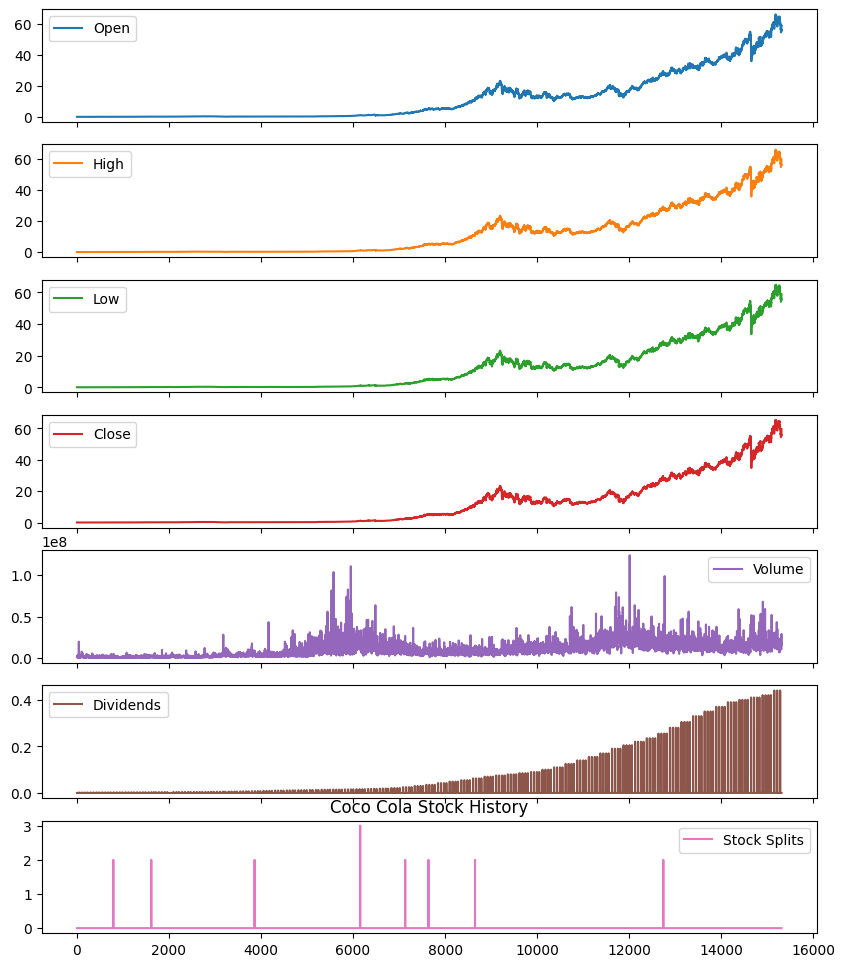

In [ ]:
df.plot(subplots = True, figsize=(10,12))
plt.title('Coco Cola Stock History')
plt.show()

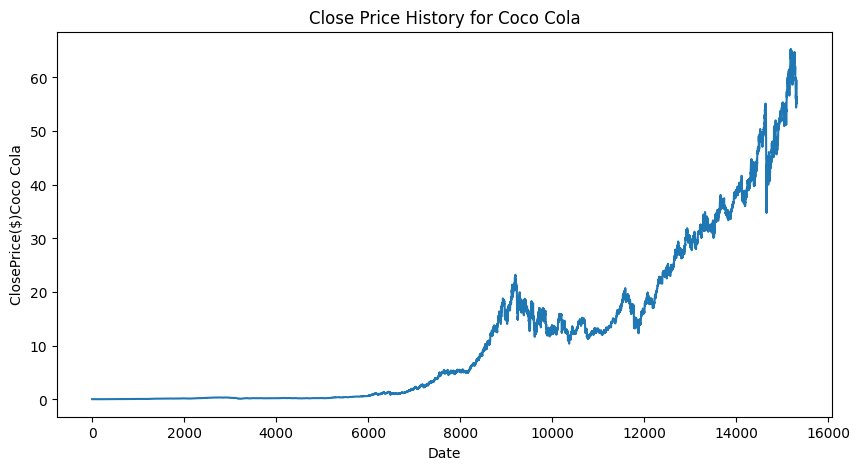

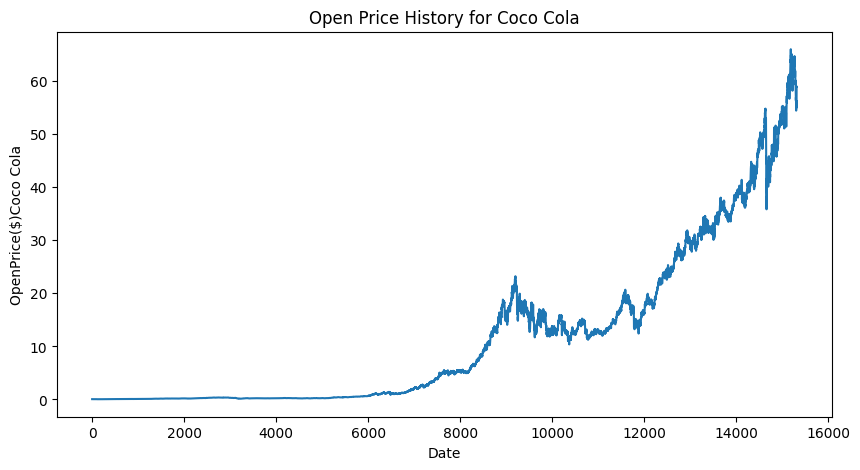

In [ ]:
def plot_close_val(data_frame,column,stock):
  plt.figure(figsize = (10,5))
  plt.title(column + ' Price History for ' + stock)
  plt.plot(data_frame[column])
  plt.xlabel('Date')
  plt.ylabel(column + 'Price($)' + stock)
  plt.show()

plot_close_val(df, 'Close', 'Coco Cola')
plot_close_val(df, 'Open', 'Coco Cola')

<Axes: >

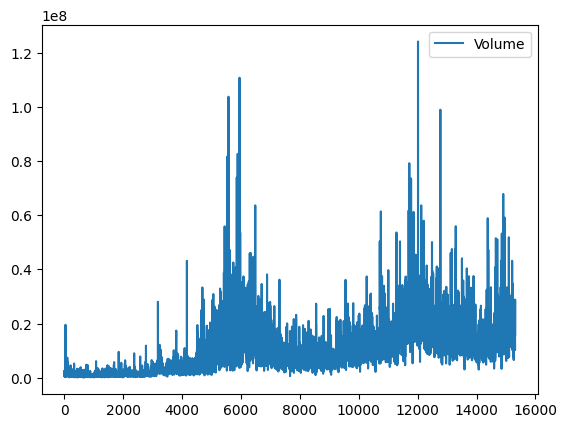

In [ ]:
df[["Volume"]].plot()

<Axes: >

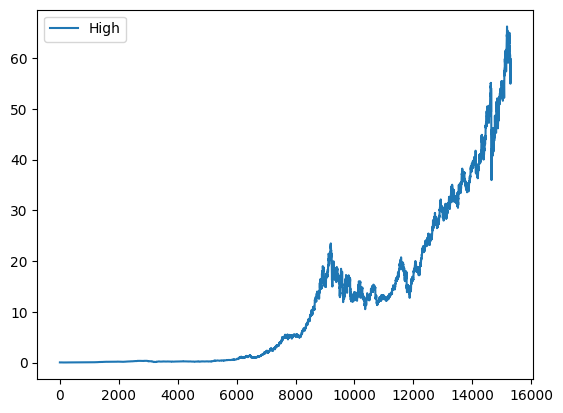

In [ ]:
df[["High"]].plot()

<Axes: >

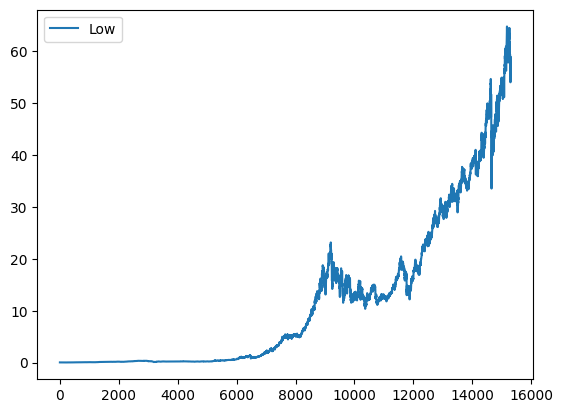

In [ ]:
df[["Low"]].plot()

<Axes: >

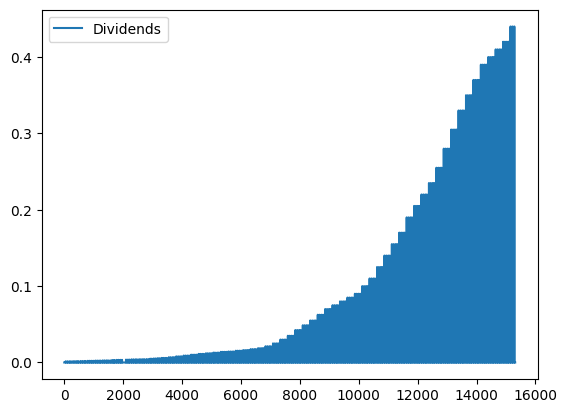

In [ ]:
df[["Dividends"]].plot()

<Axes: >

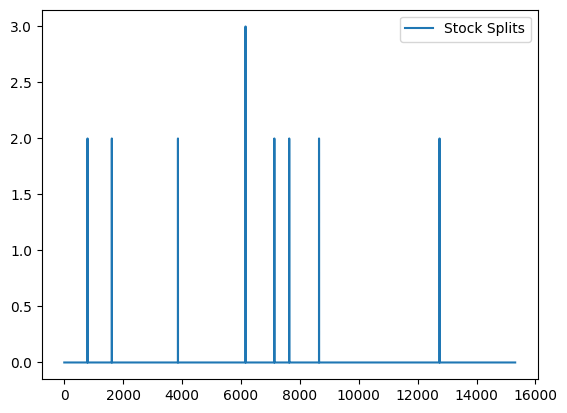

In [ ]:
df[["Stock Splits"]].plot()

**Basic Company Info**

In [ ]:
df = pd.read_csv(
    '/content/Coca-Cola_stock_history.csv',
    header=None,
    names=['Description', 'Information']
)
df.dropna()
df.drop(df.loc[df['Information']=='nan'].index,inplace=True)
data = df.sort_values('Information').style
data

,,,,,,Description,Information
1992-06-04 00:00:00-04:00,5.360981233,5.391441354,5.193450569,5.20868063,10068800,0,0
2002-07-10 00:00:00-04:00,15.68329376,15.82501087,15.10253389,15.19979095,15884200,0,0
2002-07-11 00:00:00-04:00,15.00527794,15.11642857,14.49398695,14.7579689,25808200,0,0
2002-07-12 00:00:00-04:00,14.72740442,14.72740442,14.08829085,14.18554688,17365800,0,0
2002-07-15 00:00:00-04:00,14.10218612,14.5189995,13.72427515,14.4495306,18263000,0,0
2002-07-16 00:00:00-04:00,14.185548,14.36616755,13.9187877,13.99659252,13761800,0,0
2002-07-17 00:00:00-04:00,14.22722873,14.4356354,13.82430896,13.89377785,19555200,0,0
2002-07-18 00:00:00-04:00,13.90766578,13.99380755,13.13795067,13.31857014,15981000,0,0
2002-07-19 00:00:00-04:00,13.04069851,13.11572503,12.43215149,12.5294075,20025800,0,0
2002-07-22 00:00:00-04:00,12.55441572,13.14351151,12.47661091,12.75170708,23931200,0,0


**Basic Rolling Averages**

In [ ]:
# Reload the original DataFrame to ensure 'Close' column is present
df = pd.read_csv('/content/Coca-Cola_stock_history.csv')

#Isolating the adjusted closing prices
adj_close_px = df['Close']

moving_avg = adj_close_px.rolling(window=40).mean()
moving_avg[-10:]

,Close
15301,59.573229
15302,59.329031
15303,59.103823
15304,58.921440
15305,58.725320
15306,58.504966
15307,58.298918
15308,58.171838
15309,58.088689
15310,58.030935


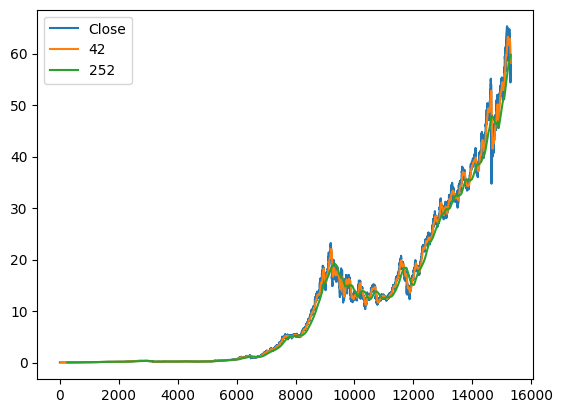

In [ ]:
df['42'] = adj_close_px.rolling(window=42).mean()
df['252'] = adj_close_px.rolling(window=252).mean()
df[['Close','42','252']].plot()
plt.show()

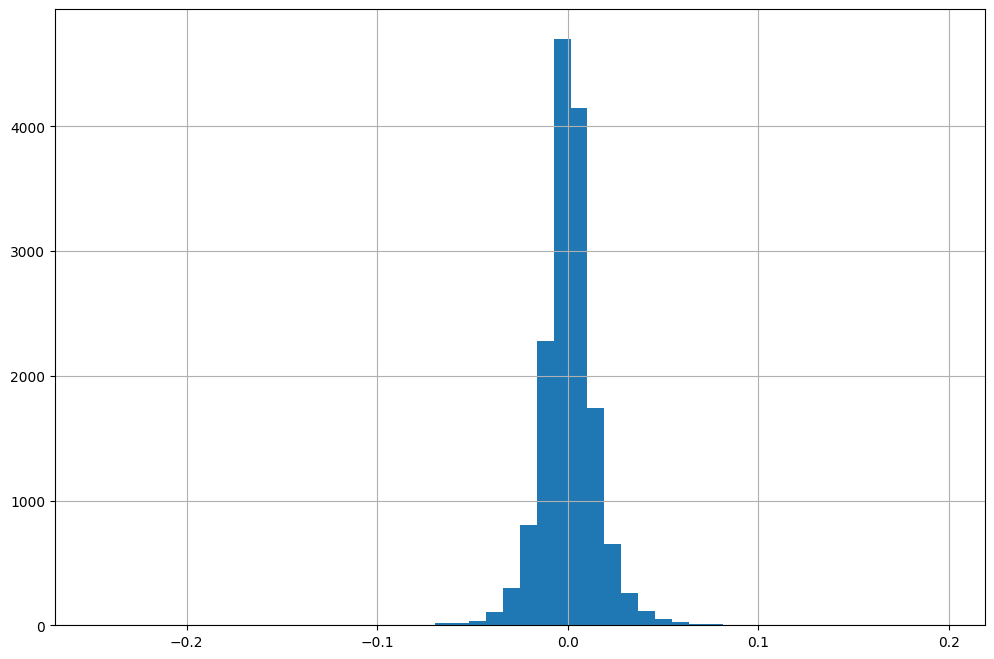

In [ ]:
a = df['Close']
daily_pct_change = a.pct_change()
daily_pct_change.hist(bins=50, figsize=(12,8))
plt.show()

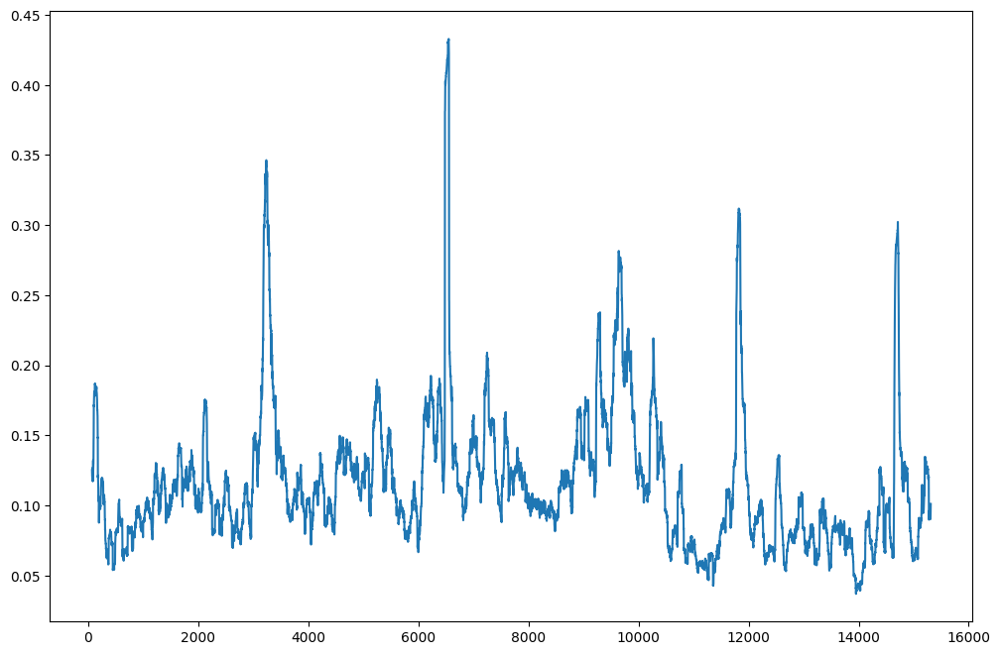

In [ ]:
min_periods = 75
vol = daily_pct_change.rolling(min_periods).std()*np.sqrt(min_periods)
vol.plot(figsize=(12,8))
plt.show()

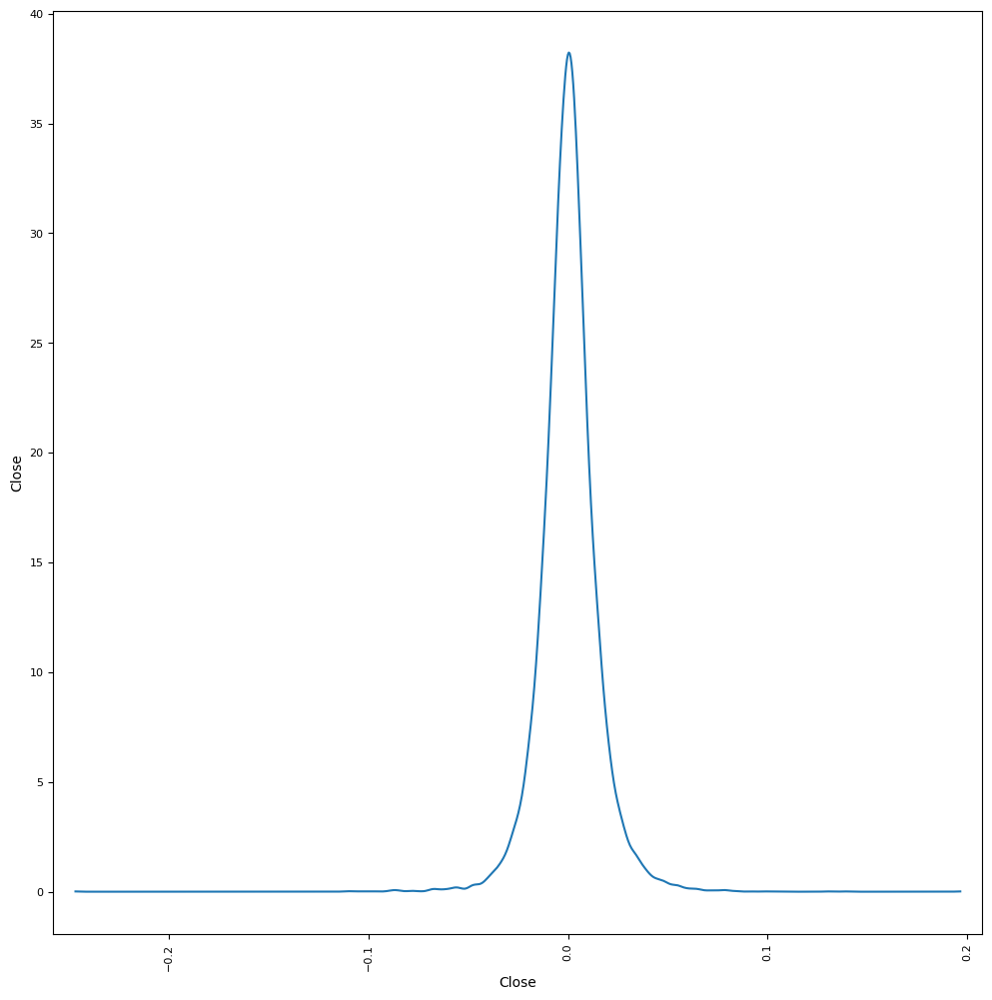

In [ ]:
#Plot the scatter plot
pd.plotting.scatter_matrix(daily_pct_change.to_frame(), diagonal='kde', alpha=0.5, figsize=(12,12))

plt.show()